In [41]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import os
import pickle

# 1. Load Calibration and Test Images

In [42]:
f = open("../camera_cal/calibration.pkl", 'rb')
ret, mtx, dist, rvecs, tvecs = pickle.load(f)
f.close()

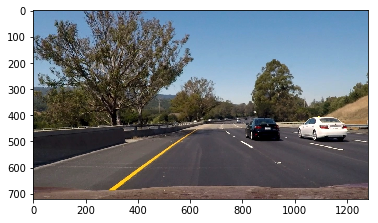

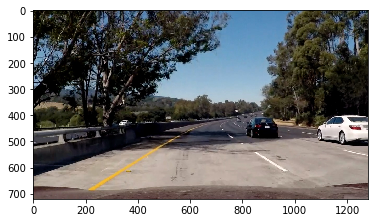

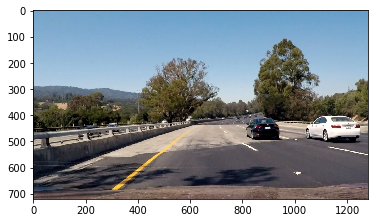

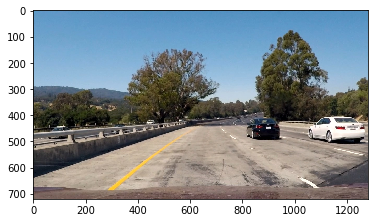

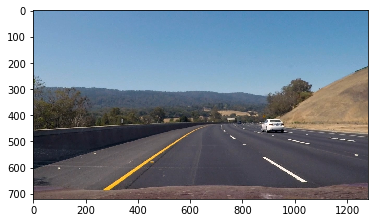

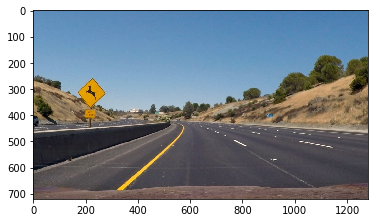

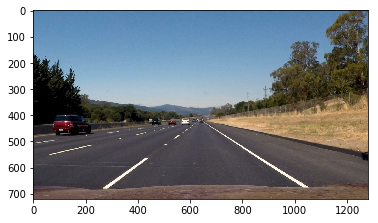

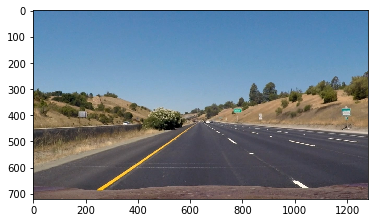

In [43]:
TEST_DIR = glob.glob("../test_images/*.jpg")
for img_link in TEST_DIR:
    img = cv2.cvtColor(cv2.imread(img_link), cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()

# 2. Correct for Camera Distortion

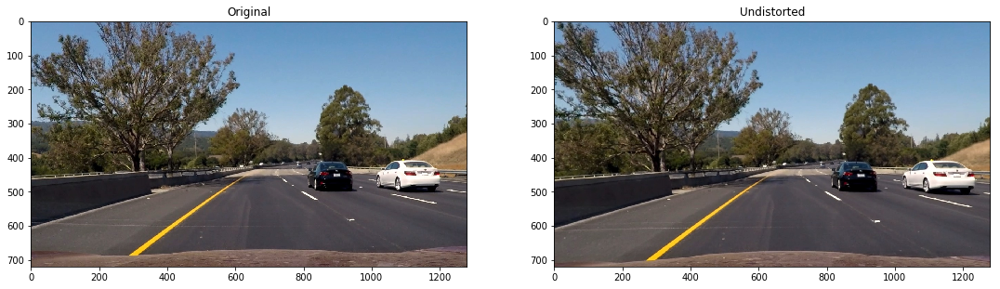

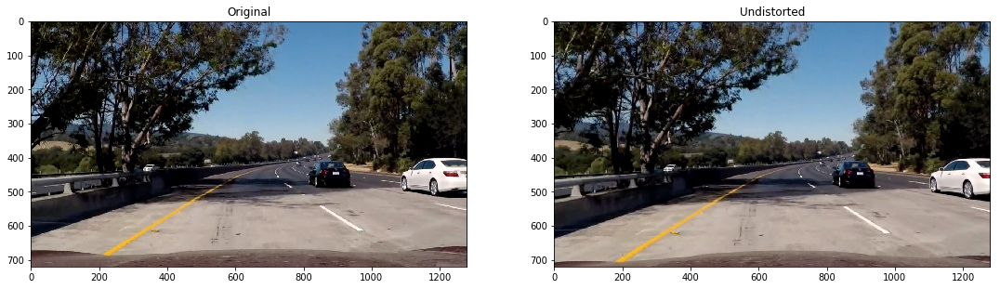

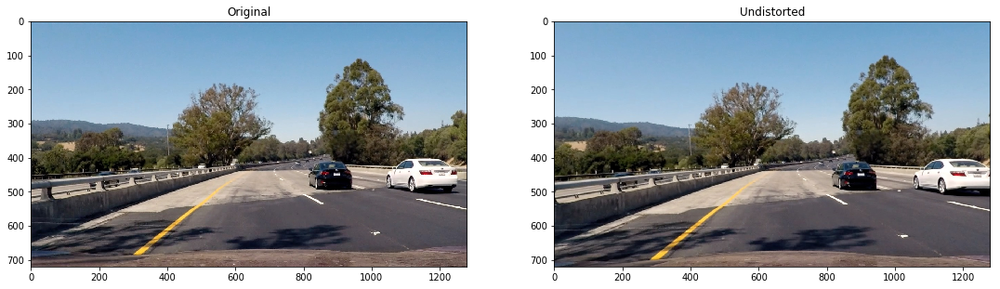

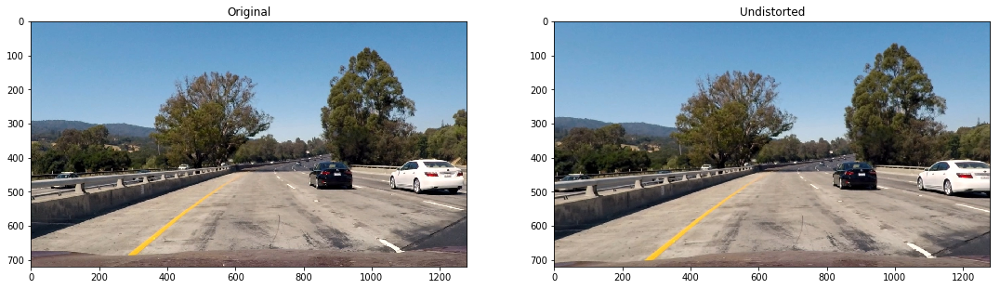

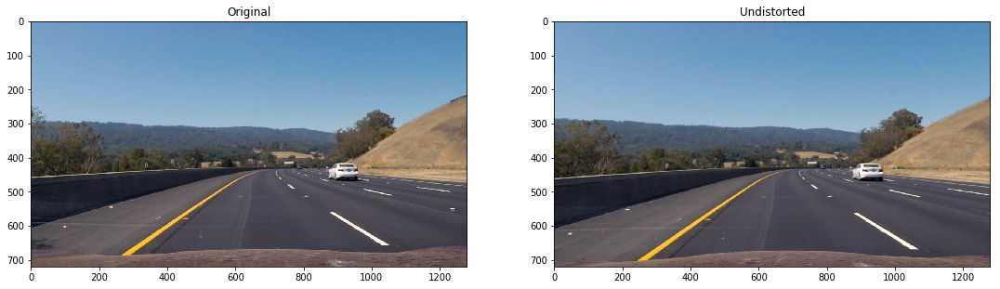

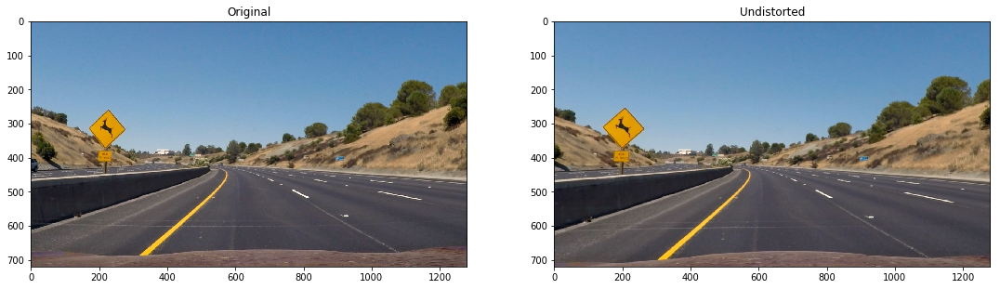

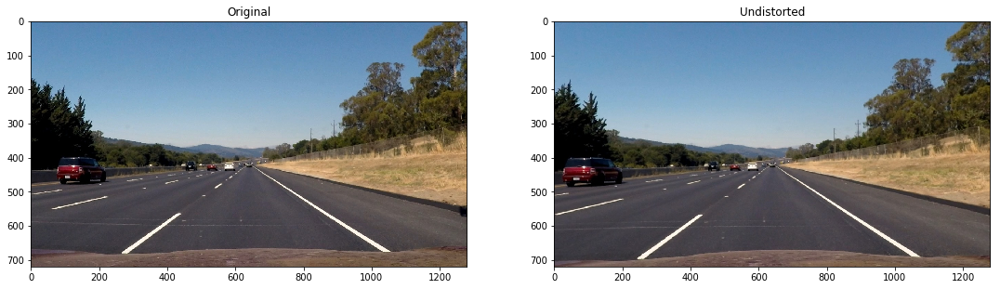

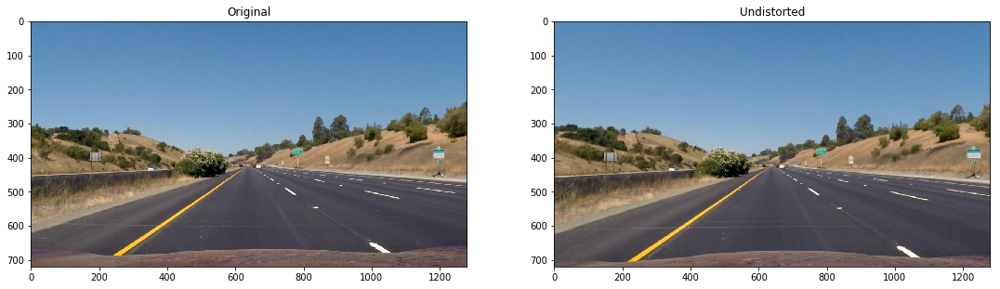

In [44]:
TEST_DIR = glob.glob("../test_images/*.jpg")
for img_link in TEST_DIR:
    f, axarr = plt.subplots(1, 2)
    img = cv2.cvtColor(cv2.imread(img_link), cv2.COLOR_BGR2RGB)
    
    axarr[0].imshow(img)
    axarr[0].set_title("Original")
    
    # undistort 
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    axarr[1].imshow(dst)
    axarr[1].set_title("Undistorted")
    f.set_size_inches(18.5, 10.5, forward=True)
    f.show()

# 3. Create a thresholded binary by filtering by a) gradient magnitude b) gradient direction c) 

In [5]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh_min=0, thresh_max=255):
    
   # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # Return the result
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    # Return the binary image
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)): 
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_x = np.absolute(sobelx)
    abs_y = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    dir = np.arctan2(abs_y, abs_x)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(dir)
    # 6) Return this mask as your binary_output image
    binary_output[(dir >= thresh[0]) & (dir <= thresh[1])] = 1    
    return binary_output

# Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    # 2) Apply a threshold to the S channel
    binary_output = np.zeros_like(S)
    # 3) Return a binary image of threshold result
    binary_output[(S > thresh[0]) & (S <= thresh[1])] = 1 # placeholder line
    return binary_output


def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    return color_binary

def pipeline_binary(image):
     # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=120)
    grady = abs_sobel_thresh(image, orient='y', thresh_min=20, thresh_max=120)
    mag_binary = mag_thresh(image, sobel_kernel=9, mag_thresh=(30, 100))
    dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
    hls_binary = hls_select(image, thresh=(90, 255))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1)] = 1
    combined[((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined

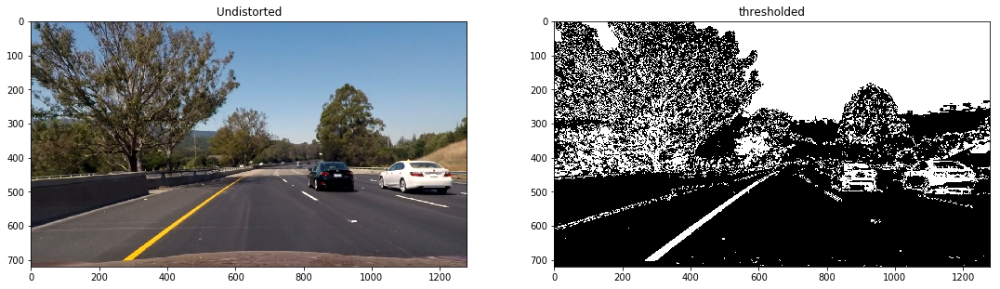

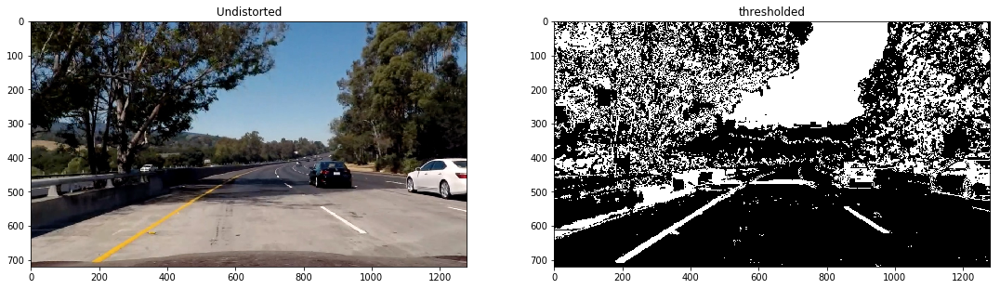

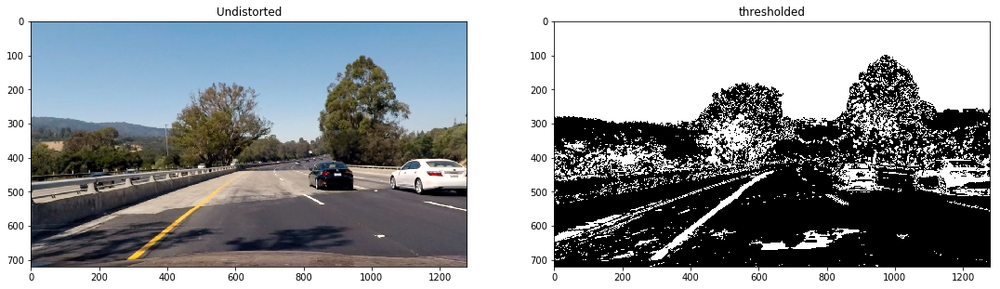

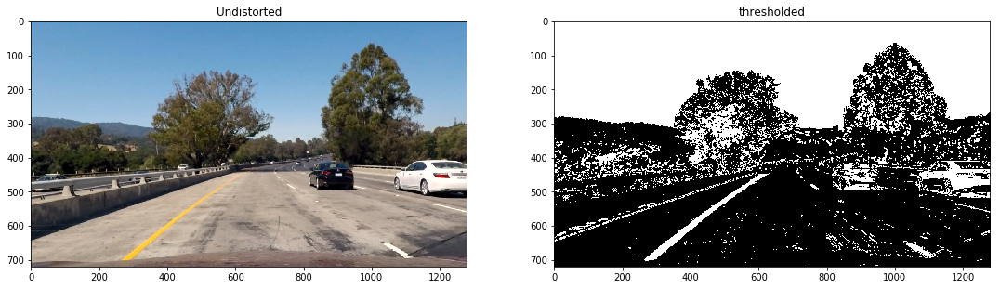

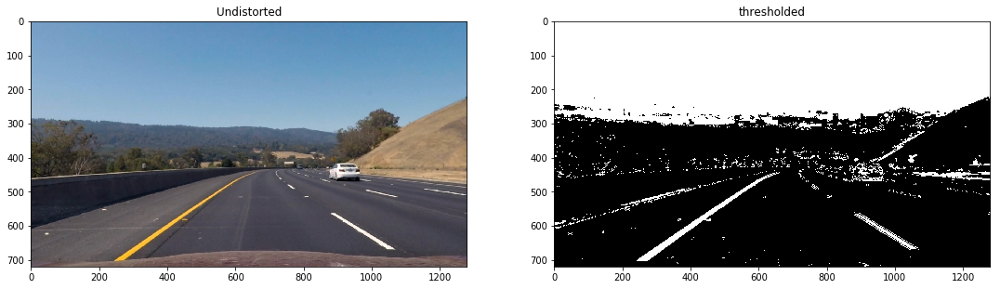

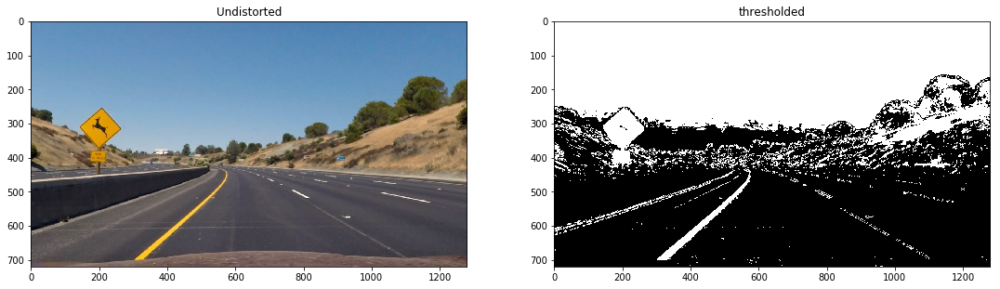

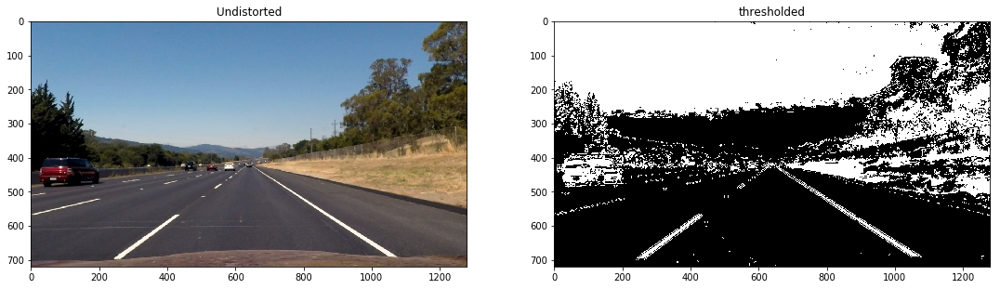

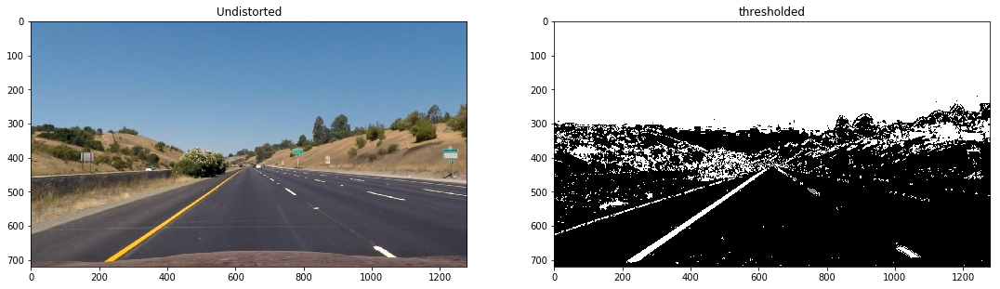

In [6]:
TEST_DIR = glob.glob("../test_images/*.jpg")
for img_link in TEST_DIR:
    f, axarr = plt.subplots(1, 2)
    img = cv2.cvtColor(cv2.imread(img_link), cv2.COLOR_BGR2RGB)
    
    # undistort 
    image = cv2.undistort(img, mtx, dist, None, mtx)
    axarr[0].imshow(image)
    axarr[0].set_title("Undistorted")
    

    # Apply each of the thresholding functions
    threshed = pipeline_binary(image)
    axarr[1].imshow(threshed, cmap='gray')
    axarr[1].set_title("thresholded")
    
    f.set_size_inches(18.5, 10.5, forward=True)
    f.show()

# Helper Functions

In [7]:
import math

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)

    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def my_decorator(func):
    def wrapper(*args, **kwargs):
        if len(wrapper.cached_lines) < wrapper.cache_size:
            wrapper.cached_lines.extend(args[1])
        else:
            wrapper.cached_lines = wrapper.cached_lines[len(args[1])::]
            wrapper.cached_lines.extend(args[1])
        return func(img=args[0], lines=wrapper.cached_lines, **kwargs)
    wrapper.cached_lines = []
    wrapper.cache_size = 300
    return wrapper

@my_decorator
def draw_lines(image, lines, color=[255, 0, 0], thickness=7):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    
    left_x, left_y, right_x, right_y = [], [], [], []
    start_left = [0, image.shape[0]] #looking for smallest y coord, and largest x-coorest smaller than image.shape[1] /2
    start_right = [image.shape[1], image.shape[0]] # looking for smallest y coord, and largest x-coord
    for line in lines:
        for x1,y1,x2,y2 in line:
            tmp_slope = ((y2 - y1) / (x2 - x1))
            if -0.9 <= tmp_slope <= -0.3:
                left_x.append(x1)
                left_x.append(x2)
                left_y.append(y1)
                left_y.append(y2)
                if x1 > start_left[0] and y1 < start_left[1] and x1 < image.shape[1] / 2:
                    start_left[0], start_left[1] = x1, y1
                elif x2 > start_left[0] and y2 < start_left[1] and x2 < image.shape[1] / 2:
                    start_left[0], start_left[1] = x2, y2
            elif 0.3 <= tmp_slope <= 0.9:
                right_x.append(x1)
                right_x.append(x2)
                right_y.append(y1)
                right_y.append(y2)
                if x1 < start_right[0] and y1 < start_right[1] and x1 > image.shape[1] / 2 :
                    start_right[0], start_right[1] = x1, y1
                elif x2 < start_left[0] and y2 < start_left[1] and x2 > image.shape[1] / 2:
                    start_right[0], start_right[1] = x2, y2
     
    if left_x and right_x:
        # y = ax + b     (y - b) / a = x
        left_fit = np.polyfit(left_x, left_y, 1)
        right_fit = np.polyfit(right_x, right_y, 1)

        # draw start coordinates
#         left_top = (start_left[0], start_left[1])
#         right_top = (start_right[0], start_right[1])

        # Need to find left_top and right_top. Y-coordinate is the same, but x is different

        left_bot_x = int((image.shape[0] - left_fit[1]) / left_fit[0])
        right_bot_x = int((image.shape[0] - right_fit[1]) / right_fit[0])

        left_bot = (left_bot_x, image.shape[0])
        right_bot = (right_bot_x, image.shape[0])

        cv2.line(img, left_bot, left_top, color, thickness)
        cv2.line(img, right_top, right_bot, color, thickness)

        
def drawBirdsEye(image, lines, color=[255, 0, 0], thickness=7):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    
    left_x, left_y, right_x, right_y = [], [], [], []
    start_left = [0, image.shape[0]] #looking for smallest y coord, and largest x-coorest smaller than image.shape[1] /2
    start_right = [image.shape[1], image.shape[0]] # looking for smallest y coord, and largest x-coord
    for line in lines:
        for x1,y1,x2,y2 in line:
            tmp_slope = ((y2 - y1) / (x2 - x1))
            if -0.9 <= tmp_slope <= -0.3:
                left_x.append(x1)
                left_x.append(x2)
                left_y.append(y1)
                left_y.append(y2)
                if x1 > start_left[0] and y1 < start_left[1] and x1 < image.shape[1] / 2:
                    start_left[0], start_left[1] = x1, y1
                elif x2 > start_left[0] and y2 < start_left[1] and x2 < image.shape[1] / 2:
                    start_left[0], start_left[1] = x2, y2
            elif 0.3 <= tmp_slope <= 0.9:
                right_x.append(x1)
                right_x.append(x2)
                right_y.append(y1)
                right_y.append(y2)
                if x1 < start_right[0] and y1 < start_right[1] and x1 > image.shape[1] / 2 :
                    start_right[0], start_right[1] = x1, y1
                elif x2 < start_left[0] and y2 < start_left[1] and x2 > image.shape[1] / 2:
                    start_right[0], start_right[1] = x2, y2
     
    if left_x and right_x:
        left_fit = np.polyfit(left_x, left_y, 1)
        right_fit = np.polyfit(right_x, right_y, 1)

        # draw start coordinates
        # y = ax + b => (y - b) // a = x
        min_y = min(start_left[1], start_right[1])
        
        left_top_x = int((min_y - left_fit[1]) / left_fit[0])
        right_top_x = int((min_y - right_fit[1]) / right_fit[0])
        
        left_top = (left_top_x, min_y)
        right_top = (right_top_x, min_y)
        

        left_bot_x = int((image.shape[0] - left_fit[1]) / left_fit[0])
        right_bot_x = int((image.shape[0] - right_fit[1]) / right_fit[0])

        left_bot = (left_bot_x, image.shape[0])
        right_bot = (right_bot_x, image.shape[0])

        # Draw Red Dots on each of the center
        return [left_bot, left_top, right_bot, right_top]

    
def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap, birdsEye=False):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    if lines is not None and len(lines) > 0:
        if birdsEye:
            return drawBirdsEye(line_img, lines)
        else:
            draw_lines(line_img, lines)
            return line_img


# Python 3 has support for cool math symbols.
def weighted_img(img, initial_img, α=0.8, β=1., γ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows: 
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, γ)

def process_image(image):
    """
    Returns an image with lane lines drawn in
    """
    gray = grayscale(image)
    
    #define a kernel size and apply Gaussian smoothing
    blur_gray = gaussian_blur(image, kernel_size=5)
    
    # Define parameters for Canny and Apply
    val_median = np.median(image)
    std = 0.33
    low_thresh =  int(max(0, (1.0 - std) * val_median))
    high_thresh = int(min(255, (1.0 + std) * val_median))
    edges = canny(image, low_thresh, high_thresh)
    
    ## create a masked region of interest
    vertices = np.array([[(image.shape[1] * 0.1, image.shape[0]), (image.shape[1] * 0.4, image.shape[0] * 0.6), (image.shape[1] * 0.6, image.shape[0] * 0.6), (image.shape[1] * 0.9, image.shape[0])]], dtype=np.int32) 
    masked_edges = region_of_interest(edges, vertices)

    
    #Define the Hough Transform parameters
    image_hough = hough_lines(masked_edges, rho=1, theta=np.pi/180, 
                              threshold=3, min_line_len=60, max_line_gap=15)

    # Create a "color" binary image to combine with line image
    overlayed = weighted_img(image, image_hough, 0.6, 0.4)
    return overlayed

In [31]:
class NoLinesDetectedError(Exception):
    pass

def getTransformationMatrix(image, threshed=True):
    # Define parameters for Canny and Apply
    edges = None
    if threshed == True:
        edges = canny(image, 0, 1)
        image = (np.dstack((image, image, image)) * 255).astype(np.uint8)
    else:
        val_median = np.median(image)
        std = 0.33
        low_thresh =  int(max(0, (1.0 - std) * val_median))
        high_thresh = int(min(255, (1.0 + std) * val_median))
        edges = canny(image, low_thresh, high_thresh)
    
    ## create a masked region of interest
    vertices = np.array([[(image.shape[1] * 0.1, image.shape[0]), (image.shape[1] * 0.4, image.shape[0] * 0.6), (image.shape[1] * 0.6, image.shape[0] * 0.6), (image.shape[1] * 0.9, image.shape[0])]], dtype=np.int32) 
    masked_edges = region_of_interest(edges, vertices)

    # Hough lines for Bird
    res = hough_lines(masked_edges, rho=1, theta=np.pi/180, 
                              threshold=3, min_line_len=60, max_line_gap=7, birdsEye=True)
    
    
    if res is not None:
        left_bot, left_top, right_bot, right_top = res
        
        originalImage, birdsEyeImage = image.copy(), image.copy()
        originalPoints = np.array([[left_bot, left_top, right_bot, right_top]], dtype='float32')
        color = [255, 0, 0]
        thickness = 3
        offset = 150
        img_size =  (originalImage.shape[1], originalImage.shape[0])

        
        src = np.float32([left_bot, left_top, right_bot, right_top])
        dst = np.float32([[offset, img_size[1] + offset], [offset, -offset],
                              [img_size[0]- offset, img_size[1] + offset],
                             [img_size[0]-offset, -offset]])
        M = cv2.getPerspectiveTransform(src , dst)
        Minv = cv2.getPerspectiveTransform(dst, src)
        return (M, Minv), (src, dst)
    else:
        raise NoLinesDetectedError
    

def birdEyesTransform(image, threshed=True):
    """
    Given an img, apply a "bird's eye perspective transform ino the given vertices"    
    """
    # Define parameters for Canny and Apply
    edges = None
    if threshed == True:
        edges = canny(image, 0, 1)
        image = (np.dstack((image, image, image)) * 255).astype(np.uint8)
    else:
        val_median = np.median(image)
        std = 0.33
        low_thresh =  int(max(0, (1.0 - std) * val_median))
        high_thresh = int(min(255, (1.0 + std) * val_median))
        edges = canny(image, low_thresh, high_thresh)
    
    ## create a masked region of interest
    vertices = np.array([[(image.shape[1] * 0.1, image.shape[0]), (image.shape[1] * 0.4, image.shape[0] * 0.6), (image.shape[1] * 0.6, image.shape[0] * 0.6), (image.shape[1] * 0.9, image.shape[0])]], dtype=np.int32) 
    masked_edges = region_of_interest(edges, vertices)

    # Hough lines for Bird
    res = hough_lines(masked_edges, rho=1, theta=np.pi/180, 
                              threshold=3, min_line_len=60, max_line_gap=7, birdsEye=True)
    
    
    if res is not None:
        left_bot, left_top, right_bot, right_top = res
        
        originalImage, birdsEyeImage = image.copy(), image.copy()
        originalPoints = np.array([[left_bot, left_top, right_bot, right_top]], dtype='float32')
        color = [255, 0, 0]
        thickness = 3
        offset = 150
        img_size =  (originalImage.shape[1], originalImage.shape[0])

        
        src = np.float32([left_bot, left_top, right_bot, right_top])
        dst = np.float32([[offset, img_size[1] + offset], [offset, -offset],
                              [img_size[0]- offset, img_size[1] + offset],
                             [img_size[0]-offset, -offset]])
        M = cv2.getPerspectiveTransform(src , dst)
        Minv = cv2.getPerspectiveTransform(dst, src)
        
        birdsEyeImage = cv2.warpPerspective(originalImage, M, img_size)
        birdsEyePoints = cv2.perspectiveTransform(originalPoints, M)

        return (originalImage, originalPoints), (birdsEyeImage, birdsEyePoints), (M, Minv)
    else:
        raise NoLinesDetectedError

# 3. Apply a Perspective Transform for Bird's eye view.


M.shape: (3, 3), srcPoints.shape: (4, 2), dstPoints: (4, 2)
M.shape: (3, 3), srcPoints.shape: (4, 2), dstPoints: (4, 2)
M.shape: (3, 3), srcPoints.shape: (4, 2), dstPoints: (4, 2)
M.shape: (3, 3), srcPoints.shape: (4, 2), dstPoints: (4, 2)


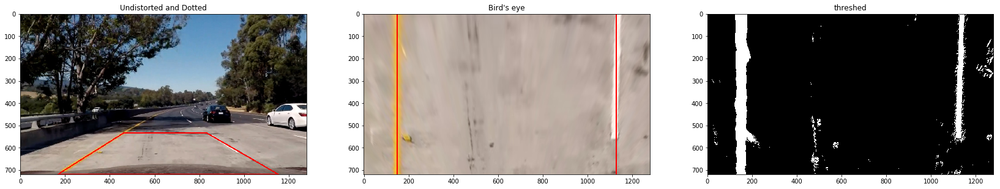

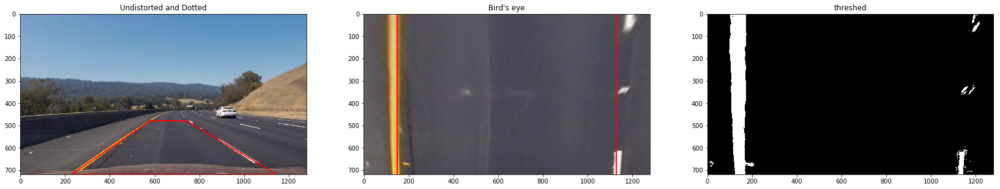

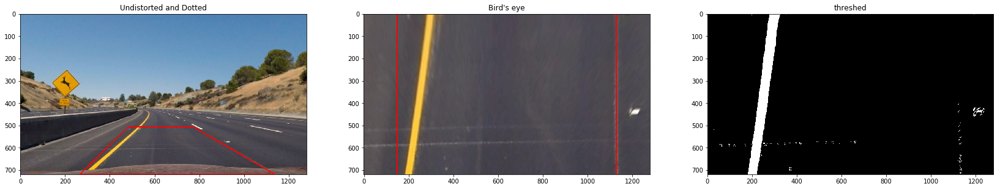

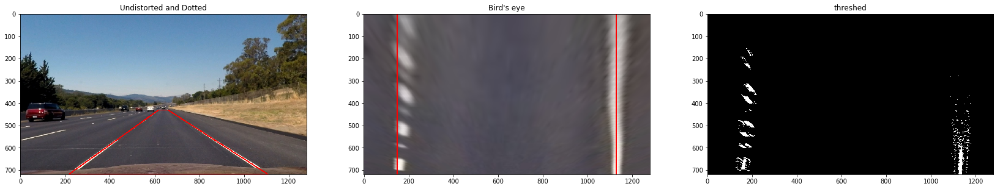

In [34]:
TEST_DIR = glob.glob("../test_images/*.jpg")
BINARY_DIR = "../binary_output/"
if not os.path.exists(BINARY_DIR):
    os.makedirs(BINARY_DIR)
i = 0
for img_link in TEST_DIR:
    img = cv2.cvtColor(cv2.imread(img_link), cv2.COLOR_BGR2RGB)
    img = cv2.undistort(img, mtx, dist, None, mtx)
    threshed = pipeline_binary(img).astype(np.uint8)
    
    # get the transformation matrix
    try:
        (M, Minv), (srcPoints, dstPoints) = getTransformationMatrix(img, threshed=False)
    except NoLinesDetectedError:
        continue
    
    # Transform from the original image to birds eyeview
    print('M.shape: {}, srcPoints.shape: {}, dstPoints: {}'.format(M.shape, srcPoints.shape, dstPoints.shape))
    img_size = (img.shape[1], img.shape[0])
    birdsEyeView = cv2.warpPerspective(img, M, img_size)
    birdsEyePoints = cv2.perspectiveTransform(np.array([srcPoints]), M)

    f, axarr = plt.subplots(1, 3)
    color=[255, 0, 0]
    thickness=3
    cv2.line(img, tuple(srcPoints[0]), tuple(srcPoints[1]), color, thickness=thickness)
    cv2.line(img, tuple(srcPoints[1]), tuple(srcPoints[3]), color, thickness=thickness)
    cv2.line(img, tuple(srcPoints[2]), tuple(srcPoints[3]), color, thickness=thickness)
    cv2.line(img, tuple(srcPoints[2]), tuple(srcPoints[0]), color, thickness=thickness)
    axarr[0].imshow(img, cmap='gray')
    axarr[0].set_title("Undistorted and Dotted")

    # undistort
    bePoints = birdsEyePoints[0][:, :2]
    birdsEyeView2 = birdsEyeView.copy()

    cv2.line(birdsEyeView, tuple(bePoints[0]), tuple(bePoints[1]), color, thickness=thickness)
    cv2.line(birdsEyeView, tuple(bePoints[1]), tuple(bePoints[3]), color, thickness=thickness)
    cv2.line(birdsEyeView, tuple(bePoints[2]), tuple(bePoints[3]), color, thickness=thickness)
    cv2.line(birdsEyeView, tuple(bePoints[2]), tuple(bePoints[0]), color, thickness=thickness)
    axarr[1].imshow(birdsEyeView, cmap='gray')
    axarr[1].set_title("Bird's eye")


    birdsEyeThreshed = pipeline_binary(birdsEyeView2)
    axarr[2].imshow(birdsEyeThreshed, cmap='gray')
    axarr[2].set_title('threshed')
    path = BINARY_DIR + str(i) + '.png'
    cv2.imwrite(path, birdsEyeThreshed.astype('uint8') * 255)
    i += 1

    f.set_size_inches(28.5, 20.5, forward=True)

# 4. Detect Lane Pixels and fit to find lane boundary

In [10]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 30

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a  line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img

def search_around_poly(binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result


bin warp shape (720, 1280)
bin warps (720, 1280)
out im shape (720, 1280, 3)


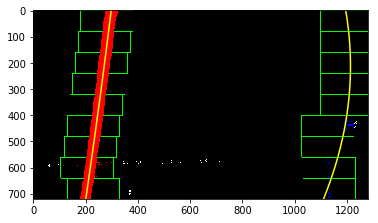

bin warp shape (720, 1280)
bin warps (720, 1280)
out im shape (720, 1280, 3)


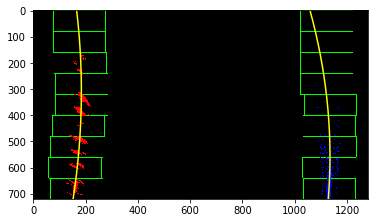

bin warp shape (720, 1280)
bin warps (720, 1280)
out im shape (720, 1280, 3)


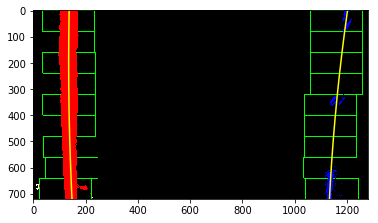

bin warp shape (720, 1280)
bin warps (720, 1280)
out im shape (720, 1280, 3)


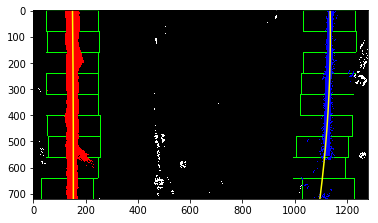

In [11]:
BINARY_DIR = glob.glob("../binary_output/*.png")
for img_link in BINARY_DIR:
    binary_warped = cv2.cvtColor(cv2.imread(img_link), cv2.COLOR_BGR2GRAY)
    out_img = fit_polynomial(binary_warped)
    plt.imshow(out_img)
    plt.show()

# Determine the curvature of the lane and vehicle position with respect to center.

In [68]:
def measure_curvature_real(ploty, left_fit_cr, right_fit_cr):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    ##### TO-DO: Implement the calculation of R_curve (radius of curvature) #####
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad

def fit_polynomial_with_curvature(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a  line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    # Adverage radius of curvature
    left_curverad, right_curverad = measure_curvature_real(ploty, left_fit, right_fit)    
    print("left_curve: {}, right_curve: {}".format(left_curverad, right_curverad))
    
    
    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    
    #zip 
    left_lane_pts = np.concatenate((left_fitx[:, np.newaxis], ploty[:, np.newaxis]), axis=1)
    right_lane_pts = np.concatenate((right_fitx[:, np.newaxis], ploty[:, np.newaxis]), axis=1)

    return out_img, left_lane_pts, right_lane_pts

bin warps (720, 1280)
out im shape (720, 1280, 3)
left_curve: 30606.547958920808, right_curve: 1290.9691620254646


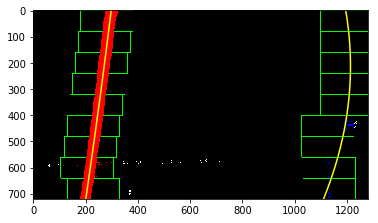

bin warps (720, 1280)
out im shape (720, 1280, 3)
left_curve: 2706.298397984772, right_curve: 2246.7521424138413


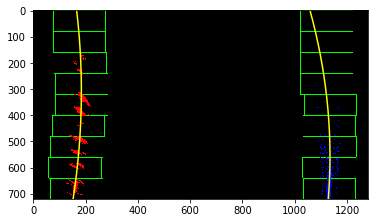

bin warps (720, 1280)
out im shape (720, 1280, 3)
left_curve: 10526.559420004052, right_curve: 8187.402150713627


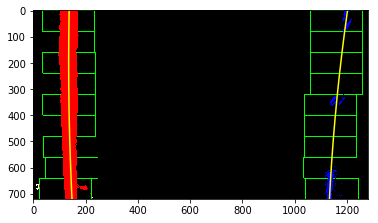

bin warps (720, 1280)
out im shape (720, 1280, 3)
left_curve: 58909.947074893425, right_curve: 4921.824664977189


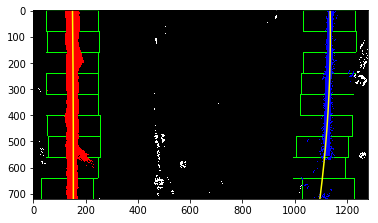

In [69]:
BINARY_DIR = glob.glob("../binary_output/*.png")
for img_link in BINARY_DIR:
    binary_warped = cv2.cvtColor(cv2.imread(img_link), cv2.COLOR_BGR2GRAY)
    out_img, left_lane_pts, right_lane_pts = fit_polynomial_with_curvature(binary_warped)        
    plt.imshow(out_img)
    plt.show()

# Warp the detected lane boundaries back onto the original image.

# Entirely Pipeline on Test Images


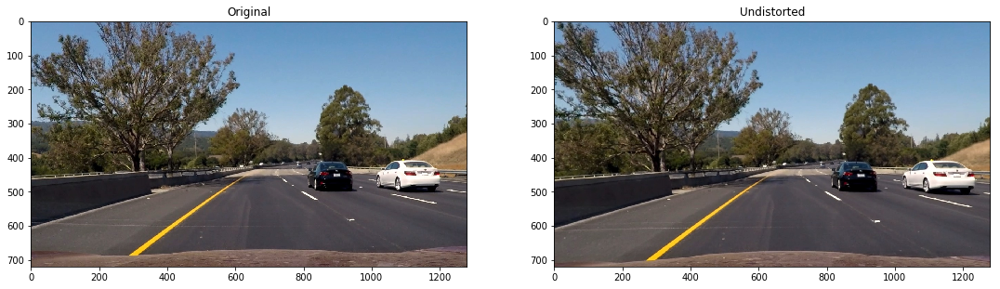

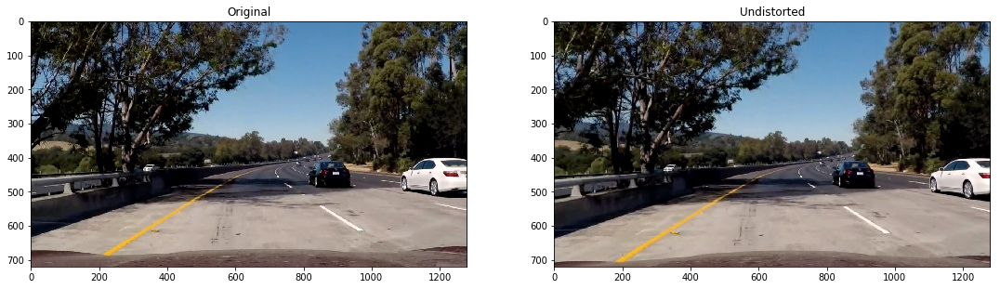

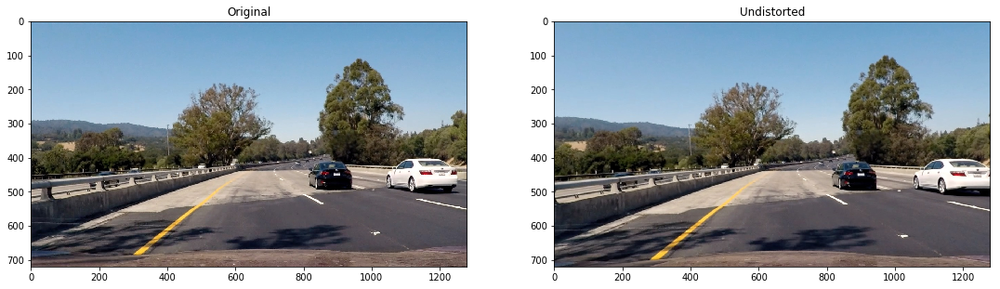

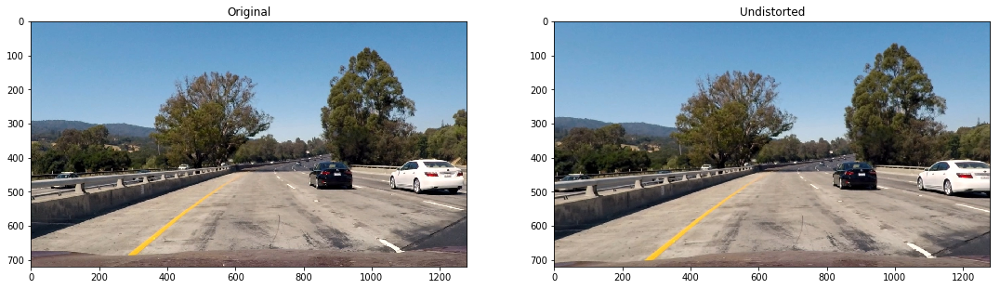

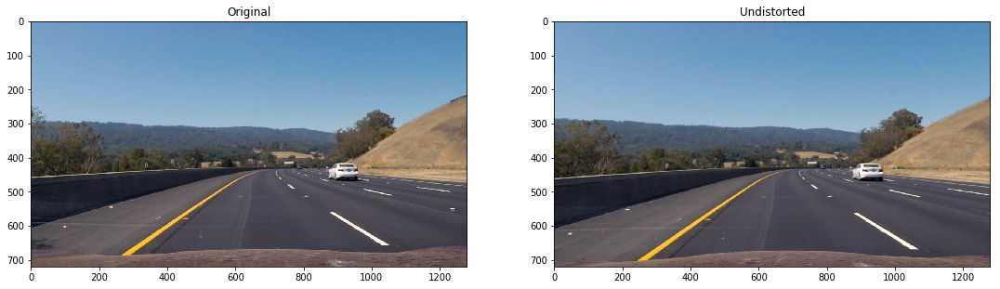

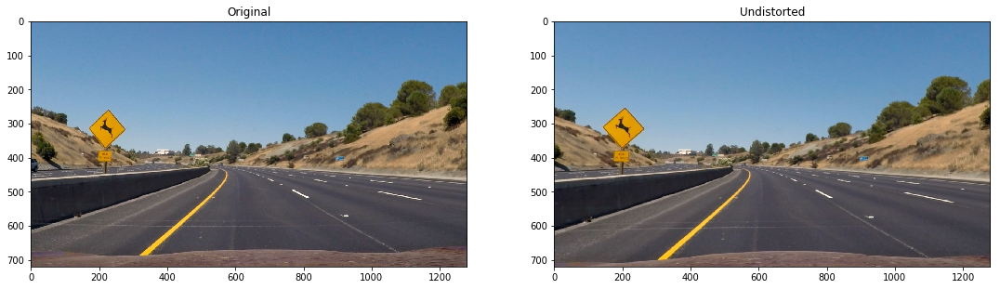

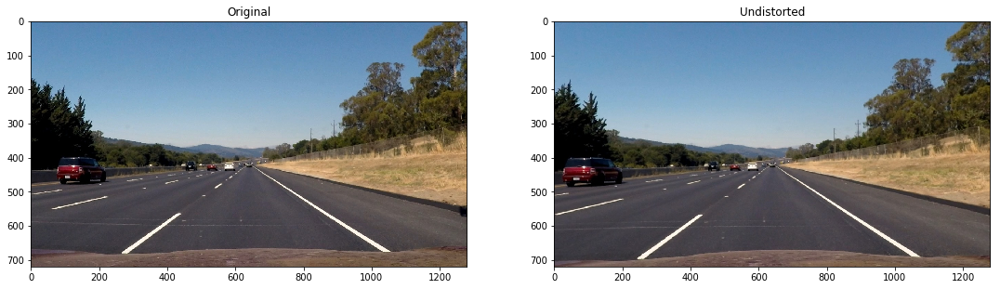

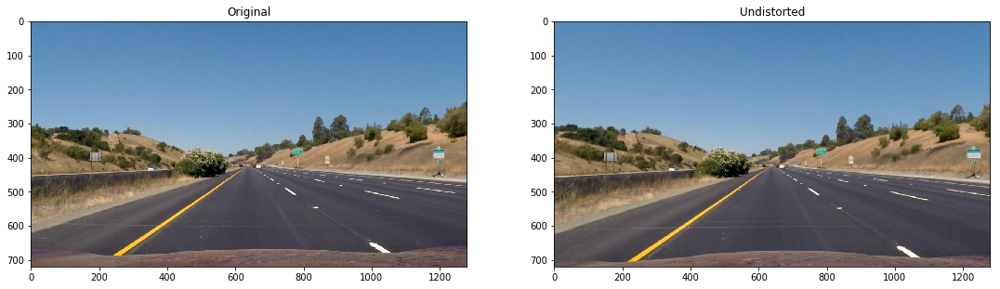

In [70]:
TEST_DIR = glob.glob("../test_images/*.jpg")
for img_link in TEST_DIR:
    f, axarr = plt.subplots(1, 2)
    img = cv2.cvtColor(cv2.imread(img_link), cv2.COLOR_BGR2RGB)
    
    axarr[0].imshow(img)
    axarr[0].set_title("Original")
    
    # undistort 
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    axarr[1].imshow(dst)
    axarr[1].set_title("Undistorted")
    f.set_size_inches(18.5, 10.5, forward=True)
    f.show()

In [75]:
def full_pipeline(img, M=None, MinV=None):
    
    """
    Returns the output from an image after running the cv pipeline
    """
    #open calibration
    f = open("../camera_cal/calibration.pkl", 'rb')
    ret, mtx, dist, rvecs, tvecs = pickle.load(f)
    f.close()
    
    # Correct for Camera Distortion
    undistorted_img = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Apply each of the thresholding functions
    threshed = pipeline_binary(undistorted_img).astype(np.uint8)
    
    # get the transformation matrix
    try:
        (M, Minv), (srcPoints, dstPoints) = getTransformationMatrix(img, threshed=False)
    except NoLinesDetectedError:
        return
        
        
    # Transform from original image to birdseEyeView
    img_size = (img.shape[1], img.shape[0])
    birdsEyeView = cv2.warpPerspective(img, M, img_size)
    birdsEyePoints = cv2.perspectiveTransform(np.array([srcPoints]), M)
    
    # Turn birdsEyeView into binary thresholded
    birdsEyeBinary = pipeline_binary(birdsEyeView.copy())
    
    # Fit a polynomial to the binary
    out_img, left_lane_pts, right_lane_pts = fit_polynomial_with_curvature(binary_warped)
    
    # Warp the detected lane boundaries back onto the original image.
    warped_left_lane = cv2.perspectiveTransform(np.array([left_lane_pts]), Minv)
    warped_right_lane = cv2.perspectiveTransform(np.array([right_lane_pts]), Minv)
    
    
    print('warpd left: {}'.format(warped_left_lane.shape))
    color = [0, 0, 255]
    cv2.polylines(img, np.int32(warped_left_lane), False, color=color)
    cv2.polylines(img, np.int32(warped_right_lane), False, color=color)
    
    plt.imshow(img)
    plt.show()


bin warps (720, 1280)
out im shape (720, 1280, 3)
left_curve: 58909.947074893425, right_curve: 4921.824664977189
warpd left: (1, 720, 2)


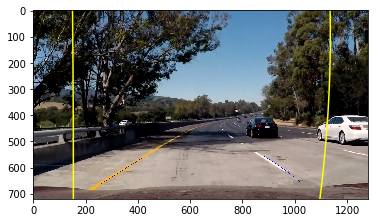

bin warps (720, 1280)
out im shape (720, 1280, 3)
left_curve: 58909.947074893425, right_curve: 4921.824664977189
warpd left: (1, 720, 2)


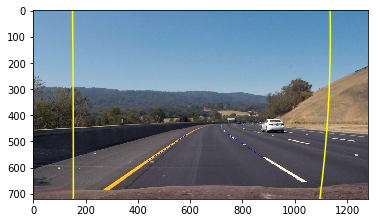

bin warps (720, 1280)
out im shape (720, 1280, 3)
left_curve: 58909.947074893425, right_curve: 4921.824664977189
warpd left: (1, 720, 2)


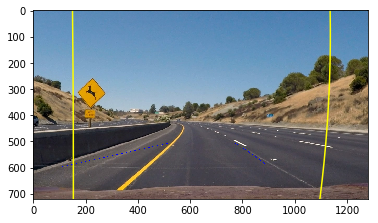

bin warps (720, 1280)
out im shape (720, 1280, 3)
left_curve: 58909.947074893425, right_curve: 4921.824664977189
warpd left: (1, 720, 2)


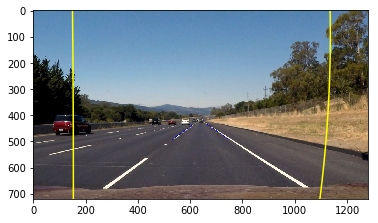

In [76]:
TEST_DIR = glob.glob("../test_images/*.jpg")
for img_link in TEST_DIR:    
    img = cv2.cvtColor(cv2.imread(img_link), cv2.COLOR_BGR2RGB)
    full_pipeline(img)